In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')
import lightgbm as lgb
import gc
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder
sns.set_style('darkgrid')
%matplotlib inline

In [8]:
POS_CASH_balance = pd.read_csv("/content/POS_CASH_balance.csv")
bureau=pd.read_csv("/content/bureau.csv")
bureau_balance=pd.read_csv("/content/bureau_balance.csv")
credit_card_balance = pd.read_csv("/content/credit_card_balance.csv")
installments_payments = pd.read_csv("/content/installments_payments.csv")
previous_application = pd.read_csv("/content/previous_application.csv")

In [9]:
print("POS CASH Balance Shape: ", POS_CASH_balance.shape)
print("Bureau Shape: ", bureau.shape)
print("Bureau Balance Shape: ", bureau_balance.shape)
print("Credit_card_balance Shape: ", credit_card_balance.shape)
print("Installments_payments Shape: ", installments_payments.shape)
print("Previous_application Shape: ", previous_application.shape)


POS CASH Balance Shape:  (10001358, 8)
Bureau Shape:  (1716428, 17)
Bureau Balance Shape:  (27299925, 3)
Credit_card_balance Shape:  (3840312, 23)
Installments_payments Shape:  (13605401, 8)
Previous_application Shape:  (1670214, 37)


In [ ]:
application_train = pd.read_csv("/content/application_train.csv")
application_test = pd.read_csv("/content/application_test.csv")


In [ ]:
print("Application Shape: ", application_train.shape)
print("Application Shape: ", application_test.shape)

Application Shape:  (199882, 122)
Application Shape:  (107629, 121)


In [11]:
def imputeCategoricalMissingValuesUsingMode(df):
  columnName = getCnamesObject(df)
  for col in columnName: df[col].fillna(df[col].mode().values[0], inplace = True)

def imputeNumericMissingValuesUsingMean(df):
  columnName = getCnamesNumeric(df)
  for col in columnName: df[col].fillna(df[col].mean(), inplace = True)

def drawPieChartForCategoricalFeatures(df, columnNames):
  number_of_rows = int((len(columnNames) + 1)/2)
  plt.figure(figsize=(20, 6*number_of_rows))

  for i in range(0,len(columnNames)):
    col = columnNames[i]
    percentage = (df[col].value_counts(dropna=True, normalize=True)*100).to_list()
    labels = list(df[col].unique())
    labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(labels, percentage)]
    sizes = list(df[col].value_counts(dropna=True))
    ax1 = plt.subplot(number_of_rows,2,i + 1)
    wedges, autotexts = ax1.pie(sizes, startangle=90)
    #ax1.axis('equal')

    ax1.legend(wedges, labels,
              title=col,
              loc="center left",
              bbox_to_anchor=(1, 0, 0.5, 1))
    plt.title(col)
  plt.show()
    
def getCnamesNumeric(df):
    return list(df.select_dtypes(exclude='object').columns)

def getCnamesObject(df):
    return list(df.select_dtypes(include='object').columns)

def getDetailsAboutMissingValuesAllColumns(df):
  return df.isna().sum()/df.shape[0]

def getDetailsAboutOnlyMissingValuesColumns(df):
  print("Shape: ", df.shape)
  return df[list(df.columns[df.isna().any()])].isna().sum()/df.shape[0]

def dropColumns(df, columnNames):
  for column in columnNames:
    df = df.drop(column, axis = 1)
  return df

def plotCountPlotForCategoricalFeatures(df, cnamesObject):
  number_of_rows = (len(cnamesObject) + 1)/2
  plt.figure(figsize=(20, 6*number_of_rows))

  for i in range(0,len(cnamesObject)):
    plt.subplot(number_of_rows,2,i+1)
    sns.countplot(y=cnamesObject[i], data = df)
    plt.title(cnamesObject[i])
    plt.tight_layout()

def distributionOfCategoricalFeaturesWRTTarget(df, cnamesObject):
  number_of_rows = (len(cnamesObject) + 1)/2
  plt.figure(figsize=(20, 6*number_of_rows))

  for i in range(0,len(cnamesObject)):
    plt.subplot(number_of_rows,2,i+1)
    sns.countplot(data=df, hue="TARGET", y=cnamesObject[i])
    plt.title(cnamesObject[i])
    plt.tight_layout()

def drawCorrelationMatrix(df) :
  length = len(getCnamesNumeric(df))
  correlaionMatrix = df.corr()
  plt.figure(figsize=(length,length*0.8))
  sns.heatmap(correlaionMatrix, annot=True, cmap = 'viridis')

def drawDistributionPlot(df, cnamesNumeric):
  number_of_rows = (len(cnamesNumeric) + 1)/2
  plt.figure(figsize=(20, 4*number_of_rows))

  for i in range(0, len(cnamesNumeric)):
    plt.subplot(number_of_rows,3,i+1)
    sns.kdeplot(df[cnamesNumeric[i]])
    plt.title(cnamesNumeric[i])
    plt.tight_layout()

def corr_columnwise(df):
  columns = df.columns
  for col in columns:
    at_corr_col = at_corr[col]
    print(col+" +ve")
    print(at_corr_col[at_corr_col>0.9].index.to_list())
    print(col+" -ve")
    print(at_corr_col[at_corr_col<-0.9].index.to_list())

def remove_corr_columns(df,atNC,atCC,df_corr):
  threshold = 0.9
  columns = np.full((df_corr.shape[0],), True, dtype=bool)
  for i in range(df_corr.shape[0]):
      for j in range(i+1, df_corr.shape[0]):
          if df_corr.iloc[i,j] >= threshold:
              if columns[j]:
                  columns[j] = False
  x_temp=df[atNC].columns[columns].to_list()
  return pd.concat([df[x_temp],df[atCC]],axis=1)

def checkOutlier(data, cnames_numeric):
    number_of_rows = (len(cnames_numeric) + 1)/2
    plt.figure(figsize=(20, 4*number_of_rows))
    
    for i in range(0,len(cnames_numeric)):
        plt.subplot(number_of_rows,4,i+1)
        sns.boxplot(x=data[cnames_numeric[i]])
        plt.title(cnames_numeric[i])
        plt.tight_layout()

def removeOutlier(data, cnamesNumeric):
    for i in cnamesNumeric:
        q75, q25 = np.percentile(data.loc[:,i], [75 ,25])
        #Calculate IQR
        iqr = q75 - q25
        #Calculate inner and outer fence
        minimum = q25 - (iqr*1.5)
        maximum = q75 + (iqr*1.5)
        #Replace with NA
        data.loc[data.loc[:,i] < minimum,i] = np.nan
        data.loc[data.loc[:,i] > maximum,i] = np.nan
    imputeNumericMissingValuesUsingMean(data)
    return data

def drawPieChartForCategoricalFeatures(df, columnNames):
  number_of_rows = int((len(columnNames) + 1)/2)
  plt.figure(figsize=(20, 6*number_of_rows))

  for i in range(0,len(columnNames)):
    col = columnNames[i]
    percentage = (df[col].value_counts(dropna=True, normalize=True)*100).to_list()
    labels = list(df[col].unique())
    labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(labels, percentage)]
    sizes = list(df[col].value_counts(dropna=True))
    ax1 = plt.subplot(number_of_rows,2,i + 1)
    wedges, autotexts = ax1.pie(sizes, startangle=90)
    #ax1.axis('equal')

    ax1.legend(wedges, labels,
              title=col,
              loc="center left",
              bbox_to_anchor=(1, 0, 0.5, 1))
    plt.title(col)
plt.show()

def applyOneHotEncoding(df, Columns):
  for col in Columns:
    ohc = OneHotEncoder()
    ohe = ohc.fit_transform(df[col].values.reshape(-1,1)).toarray()
    dfOneHot = pd.DataFrame(ohe, columns=[col+"_"+str(ohc.categories_[0][i])
                                                for i in range(len(ohc.categories_[0]))])
    df = pd.concat([df, dfOneHot.reindex(df.index)], axis=1)
    df = df.drop(col, axis = 1)
  return df
  
def plot_feature_importances(df):
    
    df = df.sort_values('importance', ascending = False).reset_index()
    df['importance_normalized'] = df['importance'] / df['importance'].sum()
    plt.figure(figsize = (10, 6))
    ax = plt.subplot()
    ax.barh(list(reversed(list(df.index[:10]))), df['importance_normalized'].head(10))

    ax.set_yticks(list(reversed(list(df.index[:10]))))
    ax.set_yticklabels(df['feature'].head(10))
  
    plt.xlabel('Percentage'); plt.title('Feature Importances')
    plt.show()
    
    return df

In [ ]:
POS_CASH_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             object 
 1   SK_ID_CURR             object 
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(3), object(3)
memory usage: 610.4+ MB


In [ ]:
POS_CASH_balance.describe()

,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,1.000136e+07,9.975287e+06,9.975271e+06,1.000136e+07,1.000136e+07
mean,-3.501259e+01,1.708965e+01,1.048384e+01,1.160693e+01,6.544684e-01
std,2.606657e+01,1.199506e+01,1.110906e+01,1.327140e+02,3.276249e+01
min,-9.600000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,-5.400000e+01,1.000000e+01,3.000000e+00,0.000000e+00,0.000000e+00
50%,-2.800000e+01,1.200000e+01,7.000000e+00,0.000000e+00,0.000000e+00
75%,-1.300000e+01,2.400000e+01,1.400000e+01,0.000000e+00,0.000000e+00
max,-1.000000e+00,9.200000e+01,8.500000e+01,4.231000e+03,3.595000e+03


In [ ]:
POS_CASH_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,6a6uarx,ox6uar,-21,60.0,56.0,Active,0,0
1,uerooox,ouaa6x,-44,10.0,3.0,Active,0,0
2,oe7e66d,ud6aa7,-79,5.0,1.0,Active,0,0
3,6rbdrxd,o7eer7,-6,48.0,26.0,Active,0,0
4,76ede7x,xo7r6d,-24,18.0,14.0,Active,6,6


In [ ]:
POS_CASH_balance.nunique()

SK_ID_PREV               936325
SK_ID_CURR               337252
MONTHS_BALANCE               96
CNT_INSTALMENT               73
CNT_INSTALMENT_FUTURE        79
NAME_CONTRACT_STATUS          9
SK_DPD                     3400
SK_DPD_DEF                 2307
dtype: int64

In [ ]:
POS_CASH_balance.duplicated()

0           False
1           False
2           False
3           False
4           False
            ...  
10001353    False
10001354    False
10001355    False
10001356    False
10001357    False
Length: 10001358, dtype: bool

In [ ]:
POS_CASH_balance.isnull().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
MONTHS_BALANCE               0
CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
NAME_CONTRACT_STATUS         0
SK_DPD                       0
SK_DPD_DEF                   0
dtype: int64

In [ ]:
# checking missing data
total = POS_CASH_balance.isnull().sum().sort_values(ascending = False)
percent = (POS_CASH_balance.isnull().sum()/POS_CASH_balance.isnull().count()*100).sort_values(ascending = False)
missing_bureaueau_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_bureaueau_data

,Total,Percent
CNT_INSTALMENT_FUTURE,26087,0.260835
CNT_INSTALMENT,26071,0.260675
SK_DPD_DEF,0,0.000000
SK_DPD,0,0.000000
NAME_CONTRACT_STATUS,0,0.000000
MONTHS_BALANCE,0,0.000000
SK_ID_CURR,0,0.000000
SK_ID_PREV,0,0.000000


In [ ]:
paCC = getCnamesObject(POS_CASH_balance)
print("Number of categorical columns in previous_application: ", len(paCC), "\n", paCC)
paCC.remove('SK_ID_PREV')
paCC.remove('SK_ID_CURR')

paNC = getCnamesNumeric(POS_CASH_balance)
print("Number of numerical columns in previous_application: ", len(paNC), "\n", paNC)

Number of categorical columns in previous_application:  3 
 ['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_STATUS']
Number of numerical columns in previous_application:  5 
 ['MONTHS_BALANCE', 'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE', 'SK_DPD', 'SK_DPD_DEF']


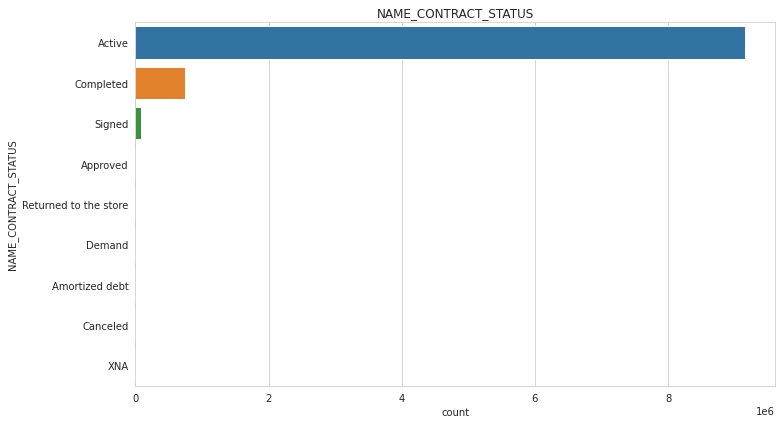

In [ ]:
plotCountPlotForCategoricalFeatures(POS_CASH_balance, paCC)

In [ ]:
POS_CASH_balance['NAME_CONTRACT_STATUS'].value_counts()

Active                   9151119
Completed                 744883
Signed                     87260
Demand                      7065
Returned to the store       5461
Approved                    4917
Amortized debt               636
Canceled                      15
XNA                            2
Name: NAME_CONTRACT_STATUS, dtype: int64

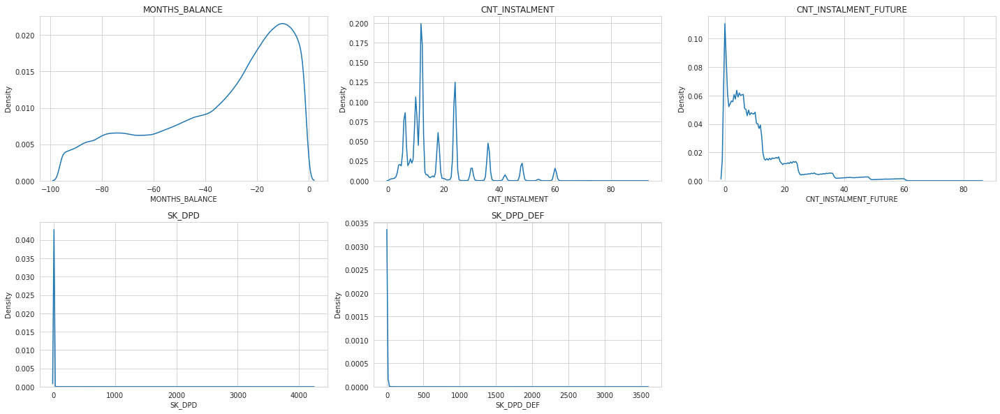

In [ ]:
drawDistributionPlot(POS_CASH_balance, paNC)

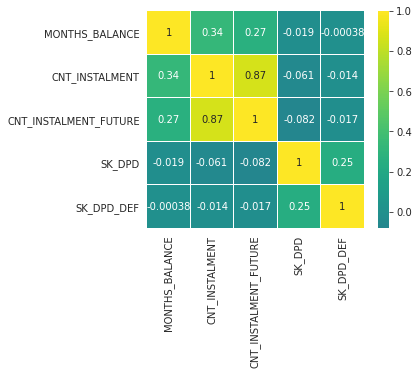

In [ ]:
drawCorrelationMatrix(POS_CASH_balance)

In [ ]:
getDetailsAboutOnlyMissingValuesColumns(POS_CASH_balance)

Shape:  (10001358, 8)


CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
dtype: int64

In [ ]:
imputeNumericMissingValuesUsingMean(POS_CASH_balance)

In [ ]:
getDetailsAboutOnlyMissingValuesColumns(POS_CASH_balance)

Shape:  (10001358, 8)


Series([], dtype: float64)

In [ ]:
bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              object 
 1   SK_ID_BUREAU            object 
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(4), object(5)
memory usage: 222.6+ MB


In [ ]:
bureau.describe()

,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04
std,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05
min,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


In [ ]:
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,ue6oex,eoxbd6b,Closed,currency 1,-1835,0,-739.0,-763.0,NaN,0,675000.0,0.0,0.0,0.0,Consumer credit,-612,0.0
1,7bxax7,6oaorab,Closed,currency 1,-904,0,-722.0,-691.0,216.945,0,31500.0,0.0,0.0,0.0,Consumer credit,-691,NaN
2,axrrbx,d7xo7bb,Closed,currency 1,-893,0,-809.0,-804.0,0.000,0,45000.0,0.0,0.0,0.0,Microloan,-796,NaN
3,a7bd7r,o6drrx6,Closed,currency 1,-2246,0,-420.0,-420.0,0.000,0,2700000.0,0.0,0.0,0.0,Consumer credit,-414,NaN
4,roaexd,a66our6,Closed,currency 1,-2584,0,-2218.0,-2218.0,7042.365,0,83205.0,0.0,0.0,0.0,Consumer credit,-2218,NaN


In [ ]:
bureau.nunique()

SK_ID_CURR                 305811
SK_ID_BUREAU              1716428
CREDIT_ACTIVE                   4
CREDIT_CURRENCY                 4
DAYS_CREDIT                  2923
CREDIT_DAY_OVERDUE            942
DAYS_CREDIT_ENDDATE         14096
DAYS_ENDDATE_FACT            2917
AMT_CREDIT_MAX_OVERDUE      68251
CNT_CREDIT_PROLONG             10
AMT_CREDIT_SUM             236708
AMT_CREDIT_SUM_DEBT        226537
AMT_CREDIT_SUM_LIMIT        51726
AMT_CREDIT_SUM_OVERDUE       1616
CREDIT_TYPE                    15
DAYS_CREDIT_UPDATE           2982
AMT_ANNUITY                 40321
dtype: int64

In [ ]:
buCC = getCnamesObject(bureau)
print("Number of categorical columns in Bureau: ", len(buCC), "\n", buCC)
buCC.remove('SK_ID_BUREAU')
buCC.remove('SK_ID_CURR')

buNC = getCnamesNumeric(bureau)
print("Number of numerical columns in Bureau: ", len(buNC), "\n", buNC)

Number of categorical columns in Bureau:  5 
 ['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']
Number of numerical columns in Bureau:  12 
 ['DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY']


In [ ]:
# checking missing data percentage
total = bureau.isnull().sum().sort_values(ascending = False)
percent = (bureau.isnull().sum()/bureau.isnull().count()*100).sort_values(ascending = False)
missing_bureau_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_bureau_data

,Total,Percent
AMT_ANNUITY,1226791,71.473490
AMT_CREDIT_MAX_OVERDUE,1124488,65.513264
DAYS_ENDDATE_FACT,633653,36.916958
AMT_CREDIT_SUM_LIMIT,591780,34.477415
AMT_CREDIT_SUM_DEBT,257669,15.011932
DAYS_CREDIT_ENDDATE,105553,6.149573
AMT_CREDIT_SUM,13,0.000757
CREDIT_TYPE,0,0.000000
AMT_CREDIT_SUM_OVERDUE,0,0.000000
CNT_CREDIT_PROLONG,0,0.000000


In [ ]:
bureau.isnull().sum()

SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY               1226791
dtype: int64

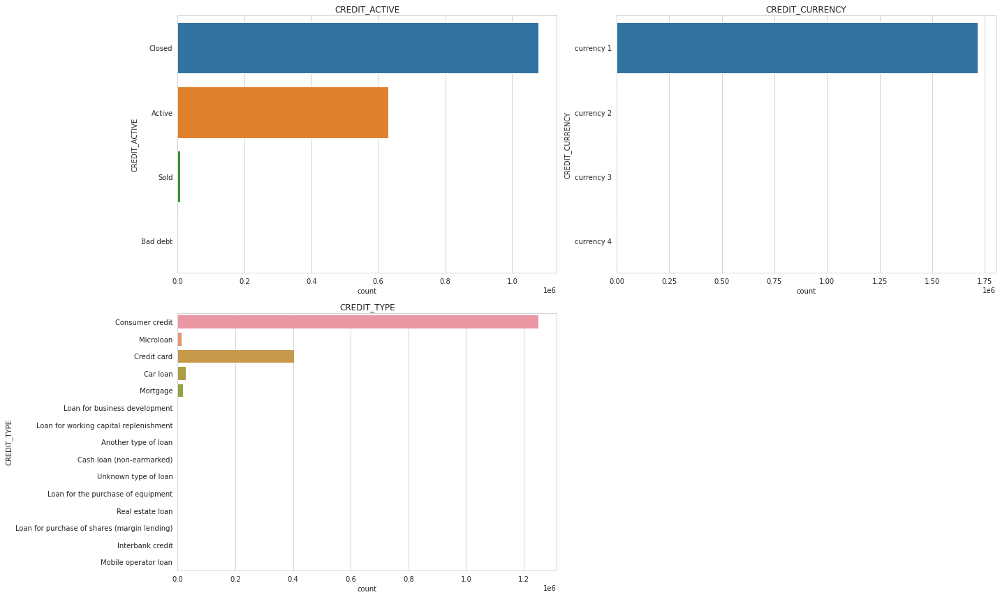

In [ ]:
plotCountPlotForCategoricalFeatures(bureau,buCC)

In [ ]:
bureau[['CREDIT_ACTIVE']].value_counts()

CREDIT_ACTIVE
Closed           1079273
Active            630607
Sold                6527
Bad debt              21
dtype: int64

In [ ]:
bureau[['CREDIT_CURRENCY']].value_counts()

CREDIT_CURRENCY
currency 1         1715020
currency 2            1224
currency 3             174
currency 4              10
dtype: int64

In [ ]:
bureau[['CREDIT_TYPE']].value_counts()

CREDIT_TYPE                                 
Consumer credit                                 1251615
Credit card                                      402195
Car loan                                          27690
Mortgage                                          18391
Microloan                                         12413
Loan for business development                      1975
Another type of loan                               1017
Unknown type of loan                                555
Loan for working capital replenishment              469
Cash loan (non-earmarked)                            56
Real estate loan                                     27
Loan for the purchase of equipment                   19
Loan for purchase of shares (margin lending)          4
Mobile operator loan                                  1
Interbank credit                                      1
dtype: int64

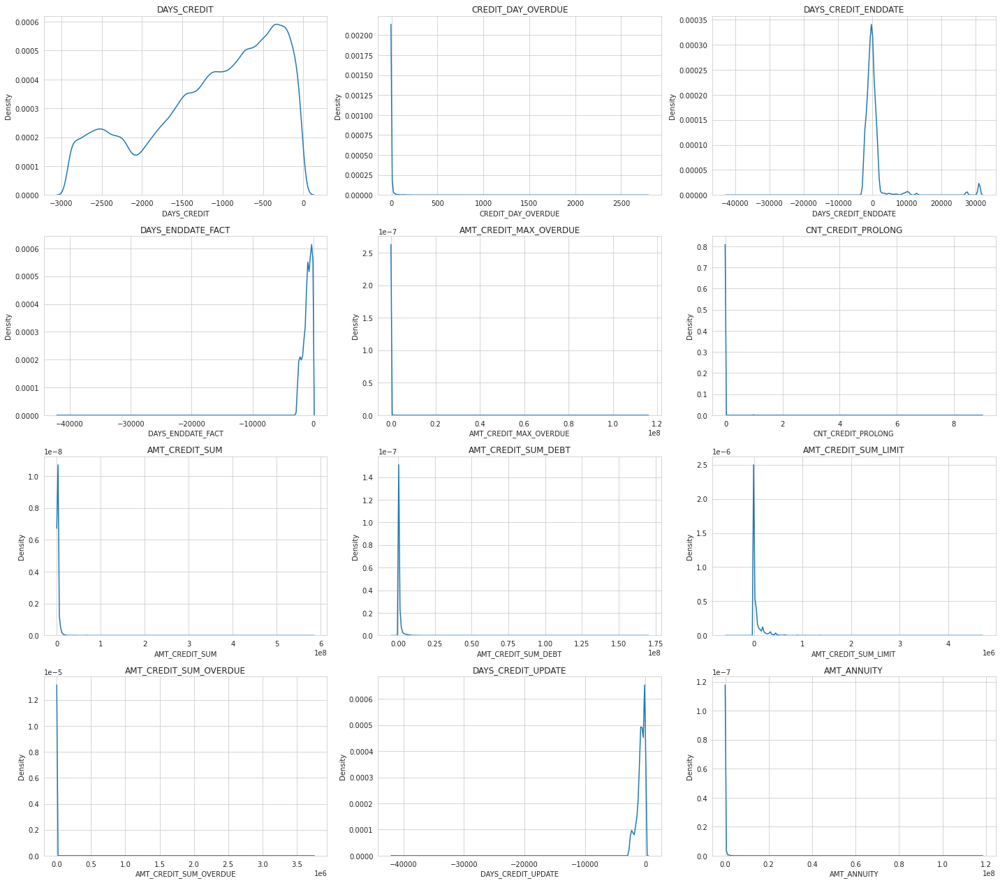

In [ ]:
drawDistributionPlot(bureau, buNC)

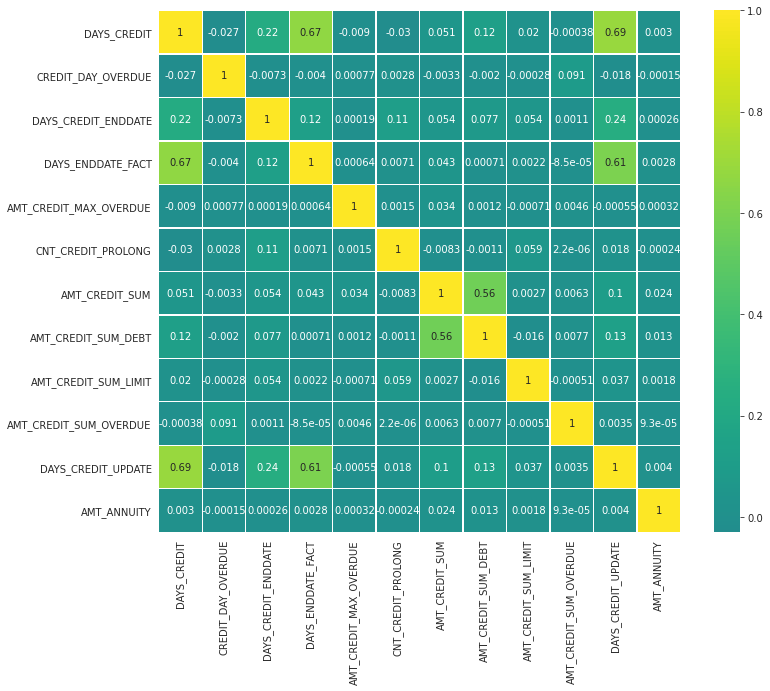

In [ ]:
drawCorrelationMatrix(bureau)

In [ ]:
getDetailsAboutOnlyMissingValuesColumns(bureau)

Shape:  (1716428, 17)


DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_ANNUITY               1226791
dtype: int64

In [ ]:
imputeNumericMissingValuesUsingMean(bureau)

In [ ]:
getDetailsAboutOnlyMissingValuesColumns(bureau)

Shape:  (1716428, 17)


Series([], dtype: float64)

In [ ]:
bureau_balance.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    object
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(1), object(2)
memory usage: 624.8+ MB


In [ ]:
bureau_balance.describe()

,MONTHS_BALANCE
count,2.729992e+07
mean,-3.074169e+01
std,2.386451e+01
min,-9.600000e+01
25%,-4.600000e+01
50%,-2.500000e+01
75%,-1.100000e+01
max,0.000000e+00


In [ ]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,rera7rb,-2,C
1,eoru6bb,-62,X
2,xebr7e6,-62,C
3,dre7676,-5,X
4,rrda6db,-70,C


In [ ]:
bureau_balance.nunique()

SK_ID_BUREAU      817395
MONTHS_BALANCE        97
STATUS                 8
dtype: int64

In [ ]:
bureau_balance.isnull().sum()

SK_ID_BUREAU      0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [ ]:
# checking missing data
total = bureau_balance.isnull().sum().sort_values(ascending = False)
percent = (bureau_balance.isnull().sum()/bureau_balance.isnull().count()*100).sort_values(ascending = False)
missing_bureau_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_bureau_data

,Total,Percent
STATUS,0,0.0
MONTHS_BALANCE,0,0.0
SK_ID_BUREAU,0,0.0


In [ ]:
balCC = getCnamesObject(bureau_balance)
print("Number of categorical columns in balance bureau: ", len(balCC), "\n", balCC)
balCC.remove('SK_ID_BUREAU')

balNC = getCnamesNumeric(bureau_balance)
print("Number of numerical columns in balance bureau: ", len(balNC), "\n", balNC)

Number of categorical columns in balance bureau:  2 
 ['SK_ID_BUREAU', 'STATUS']
Number of numerical columns in balance bureau:  1 
 ['MONTHS_BALANCE']


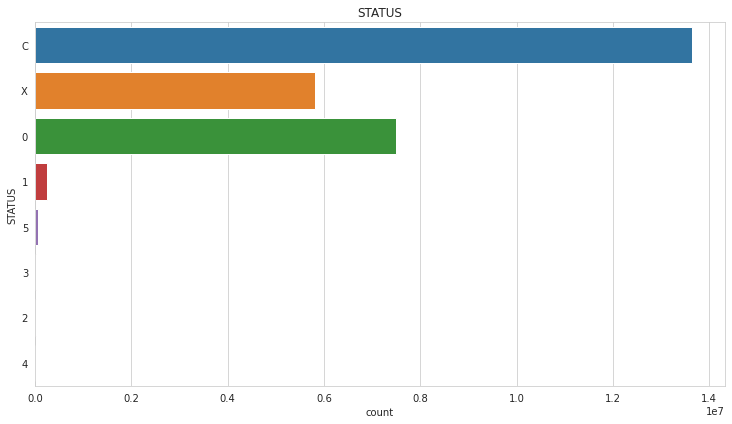

In [ ]:
plotCountPlotForCategoricalFeatures(bureau_balance,balCC)

In [ ]:
bureau_balance[['STATUS']].value_counts()

STATUS
C         13646993
0          7499507
X          5810482
1           242347
5            62406
2            23419
3             8924
4             5847
dtype: int64

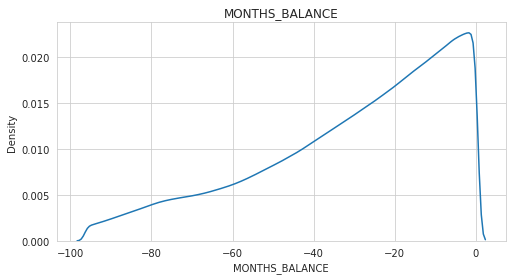

In [ ]:
drawDistributionPlot(bureau_balance,balNC)

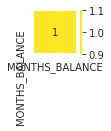

In [ ]:
drawCorrelationMatrix(bureau_balance)

In [ ]:
getDetailsAboutOnlyMissingValuesColumns(bureau_balance)

Shape:  (27299925, 3)


Series([], dtype: float64)

In [ ]:
aTrainCC = getCnamesObject(application_train)
print("Number of categorical columns in previous_application: ", len(aTrainCC), "\n", aTrainCC)
aTrainCC.remove('SK_ID_CURR')

paCC = getCnamesObject(previous_application)
print("Number of categorical columns in previous_application: ", len(paCC), "\n", paCC)
paCC.remove('SK_ID_PREV')
paCC.remove('SK_ID_CURR')

ipCC = getCnamesObject(installments_payments)
print("Number of categorical columns in installments_payments: ", len(ipCC), "\n", ipCC)

ccbCC = getCnamesObject(credit_card_balance)
print("Number of categorical columns in credit_card_balance: ", len(ccbCC), "\n", ccbCC)
ccbCC.remove('SK_ID_PREV')
ccbCC.remove('SK_ID_CURR')

paNC = getCnamesNumeric(previous_application)
print("Number of numerical columns in previous_application: ", len(paNC), "\n", paNC)
ipNC = getCnamesNumeric(installments_payments)
print("Number of numerical columns in installments_payments: ", len(ipNC), "\n", ipNC)
ccbNC = getCnamesNumeric(credit_card_balance)
print("Number of numerical columns in credit_card_balance: ", len(ccbNC), "\n", ccbNC)

Number of categorical columns in previous_application:  17 
 ['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']
Number of categorical columns in previous_application:  18 
 ['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']
Number of categorical columns in installments_payments:  2 
 ['SK_ID_PREV', 'SK_ID_CURR']
Number of categorical columns in credit_card_balance

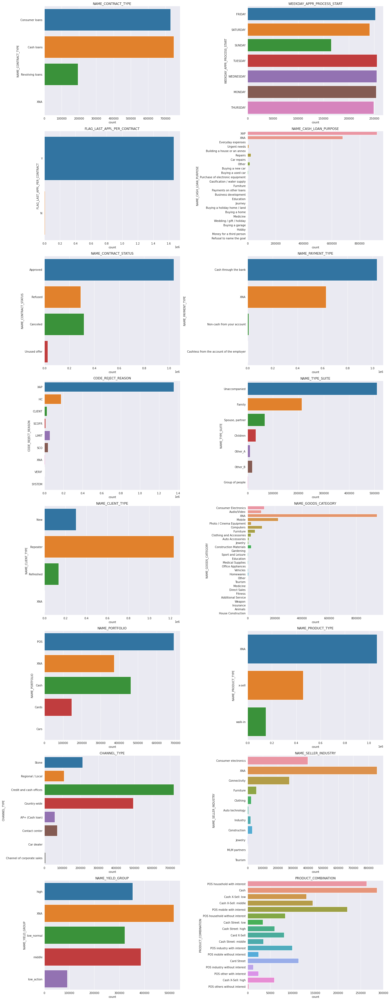

In [ ]:
plotCountPlotForCategoricalFeatures(previous_application, paCC)

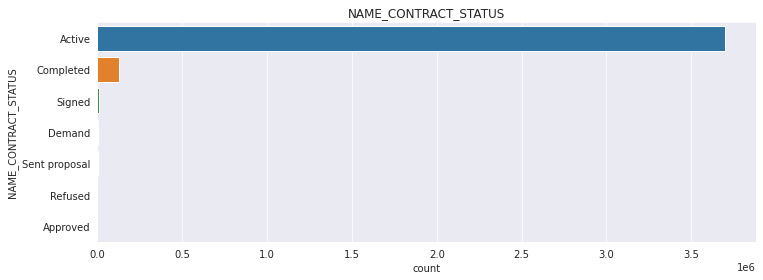

In [ ]:
plotCountPlotForCategoricalFeatures(credit_card_balance, ccbCC)

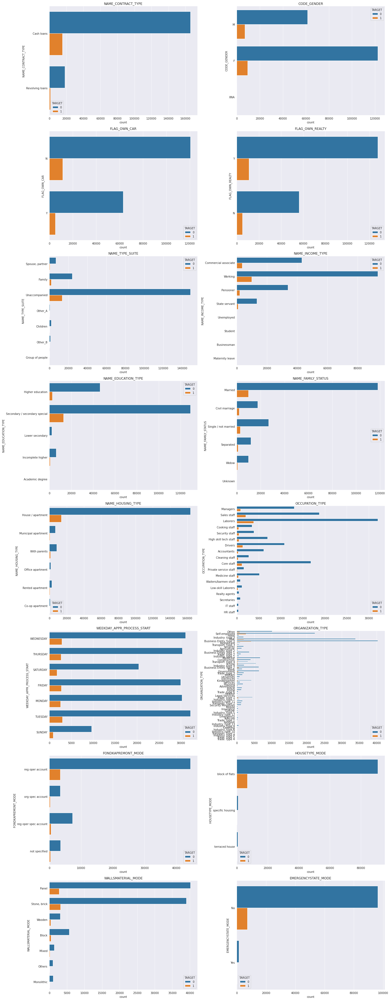

In [ ]:
distributionOfCategoricalFeaturesWRTTarget(application_train, aTrainCC)

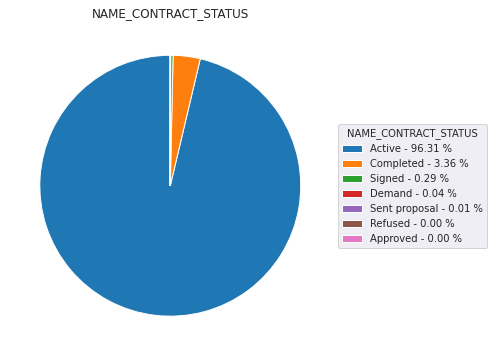

In [ ]:
drawPieChartForCategoricalFeatures(credit_card_balance, ccbCC)

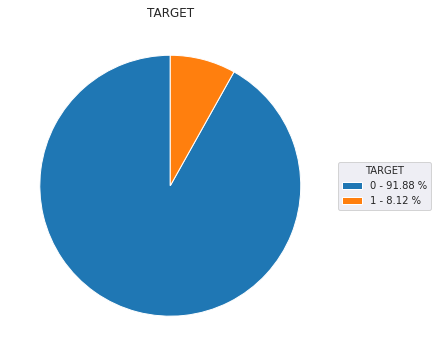

In [ ]:
targetTemp = ['TARGET']
drawPieChartForCategoricalFeatures(application_train, targetTemp)

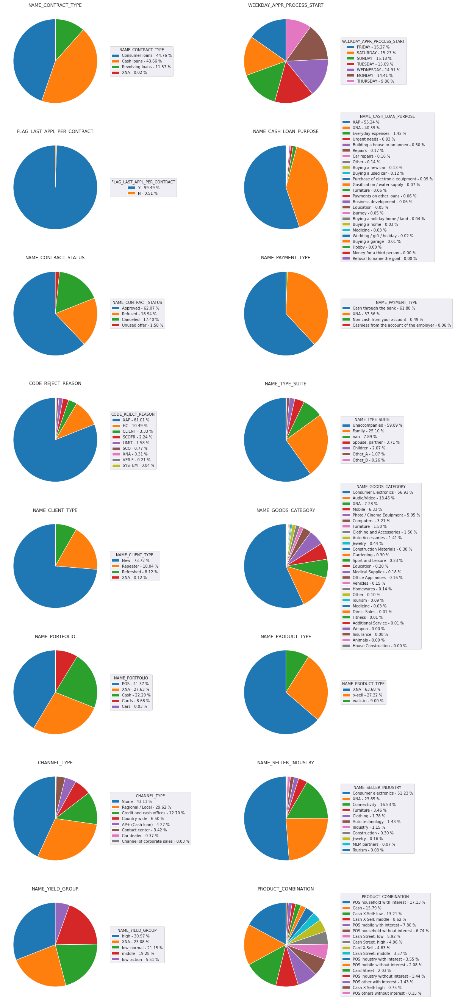

In [ ]:
drawPieChartForCategoricalFeatures(previous_application, paCC)

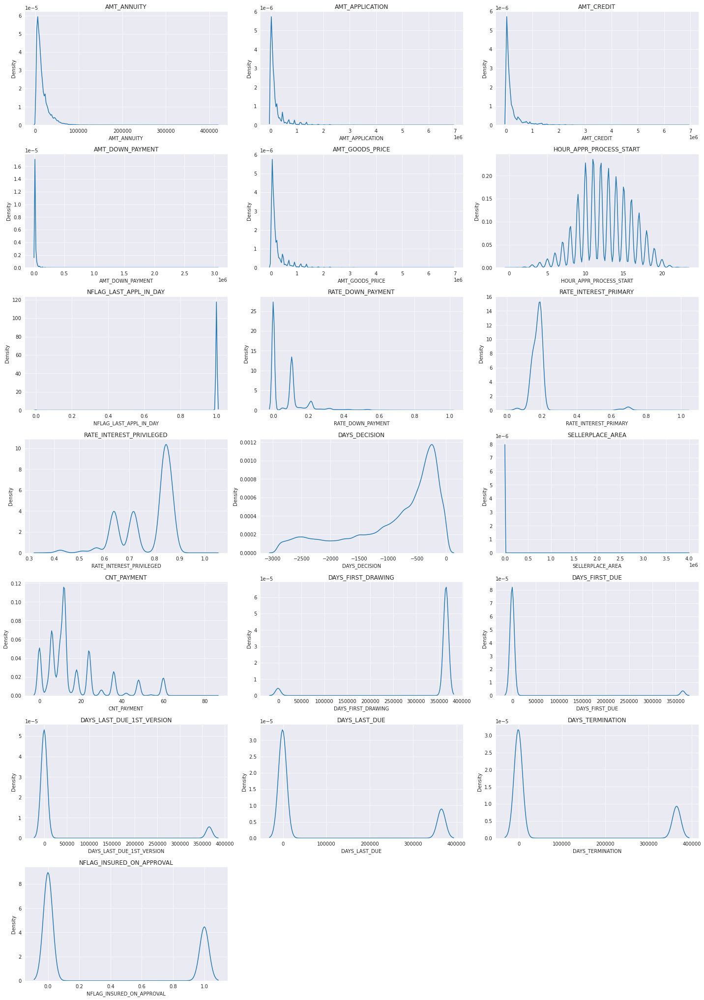

In [ ]:
drawDistributionPlot(previous_application, paNC)

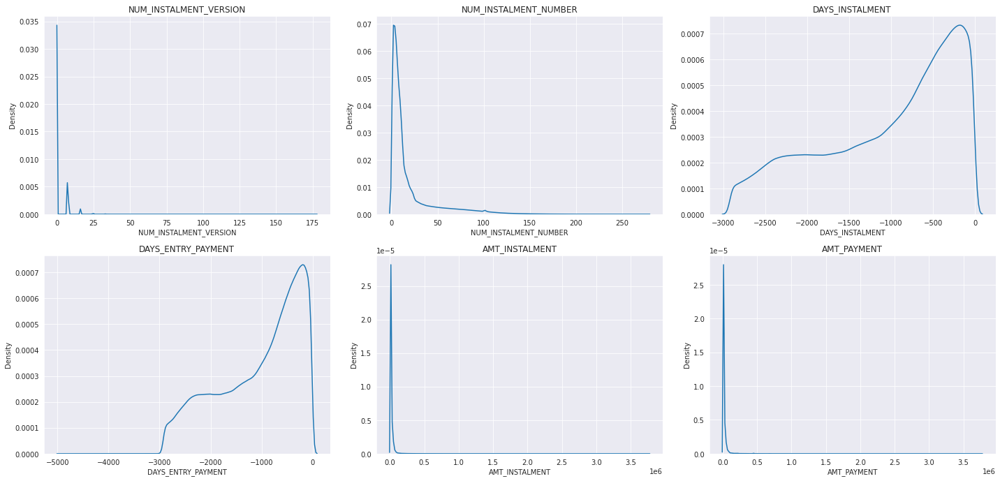

In [ ]:
drawDistributionPlot(installments_payments, ipNC)

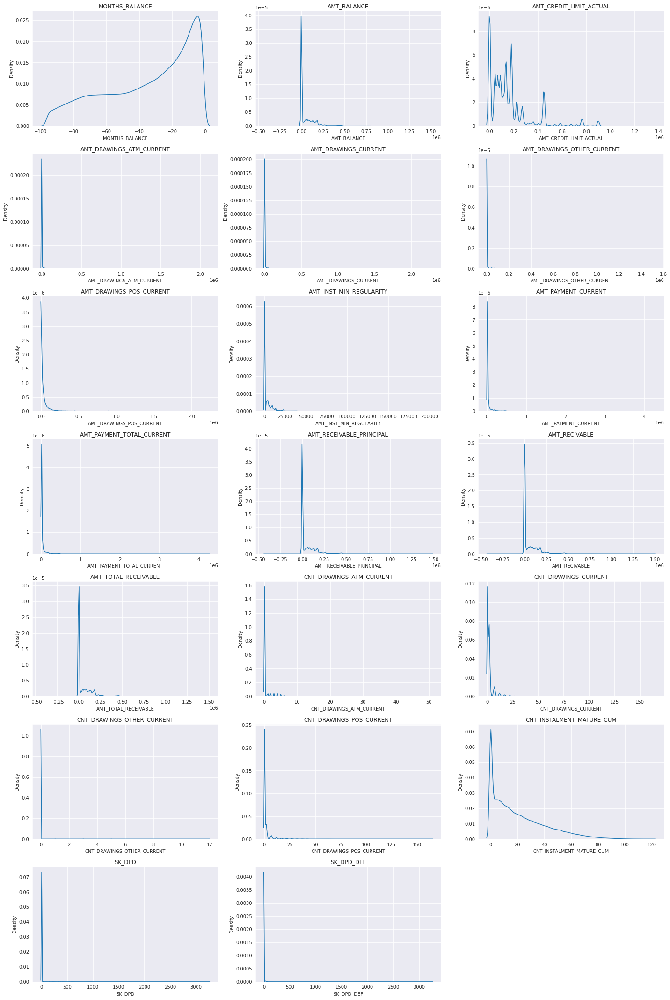

In [ ]:
drawDistributionPlot(credit_card_balance, ccbNC)

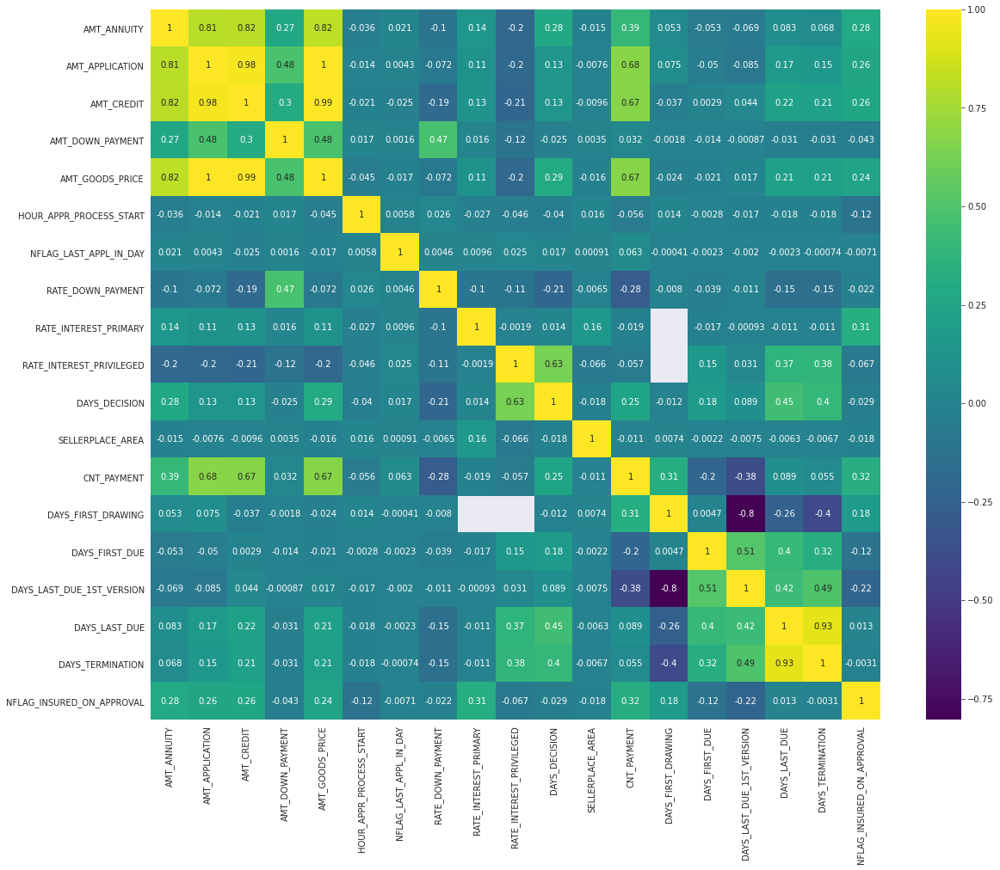

In [ ]:
drawCorrelationMatrix(previous_application)

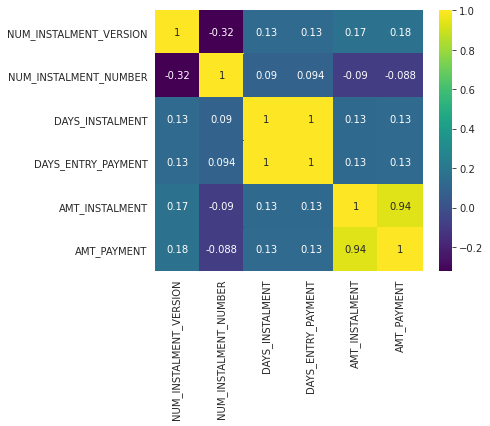

In [ ]:
drawCorrelationMatrix(installments_payments)

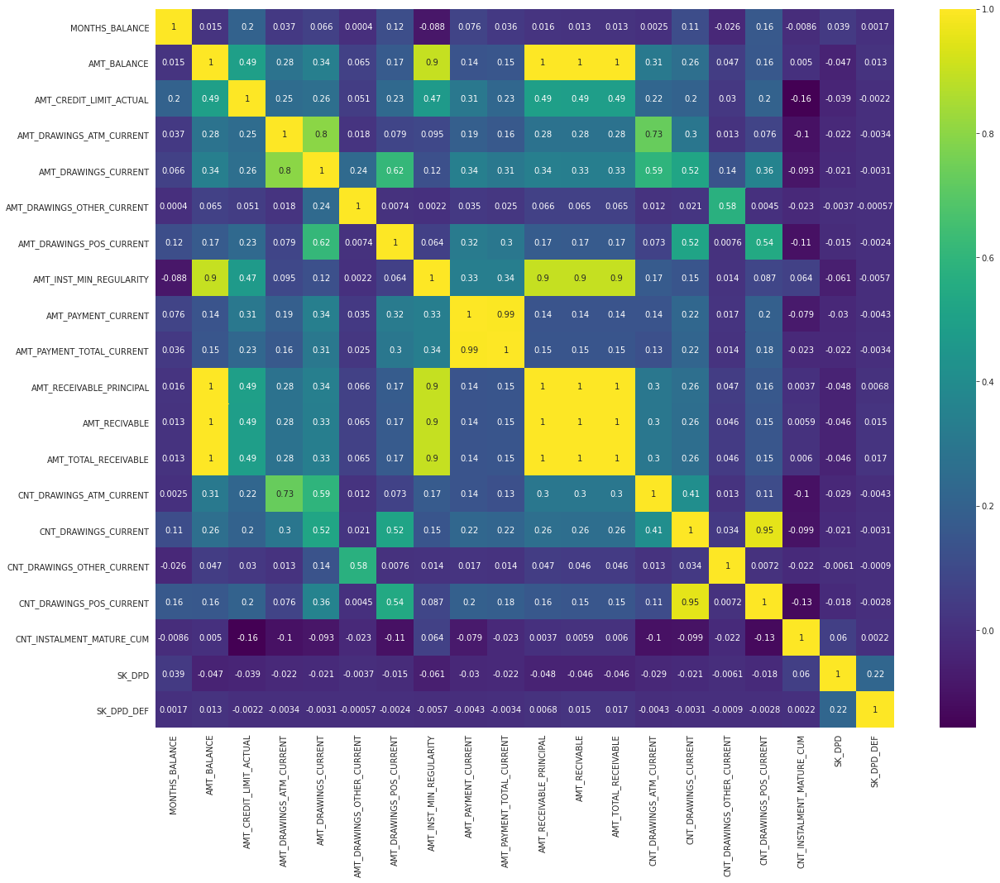

In [ ]:
drawCorrelationMatrix(credit_card_balance)

In [ ]:
getDetailsAboutOnlyMissingValuesColumns(previous_application)

Shape:  (1670214, 32)


Series([], dtype: float64)

In [ ]:
#Drop the data with more than 50% missing values becuase imputing them doesn't makes sense
missingValueColumns = ['AMT_DOWN_PAYMENT', 'RATE_DOWN_PAYMENT','RATE_INTEREST_PRIMARY','RATE_INTEREST_PRIVILEGED','NAME_TYPE_SUITE']
previous_application = dropColumns(previous_application, missingValueColumns)

In [ ]:
getDetailsAboutOnlyMissingValuesColumns(installments_payments)

Shape:  (13605401, 8)


Series([], dtype: float64)

In [ ]:
getDetailsAboutOnlyMissingValuesColumns(credit_card_balance)

Shape:  (3840312, 23)


Series([], dtype: float64)

In [ ]:
imputeNumericMissingValuesUsingMean(previous_application)
imputeNumericMissingValuesUsingMean(installments_payments)
imputeNumericMissingValuesUsingMean(credit_card_balance)

imputeCategoricalMissingValuesUsingMode(previous_application)

In [ ]:
application_train.columns.to_list()

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_A

In [ ]:
pd.set_option('max_columns', None)
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,aou6ud,0,Cash loans,M,N,Y,0,360000.0,1125000.0,33025.5,1125000.0,"Spouse, partner",Commercial associate,Higher education,Married,House / apartment,0.022800,-18943,-7369,-2353.0,-2479,NaN,1,1,0,1,0,0,Managers,2.0,2,2,WEDNESDAY,11,0,0,0,0,1,1,Other,NaN,0.358116,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,xxbaad,0,Cash loans,F,N,Y,0,112500.0,251280.0,13630.5,180000.0,Family,Working,Secondary / secondary special,Married,House / apartment,0.022625,-13894,-1393,-5698.0,-5698,NaN,1,1,0,1,0,0,Sales staff,2.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,Self-employed,NaN,0.414341,0.792264,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1645.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,6.0
2,xdrbad,0,Cash loans,F,N,Y,0,225000.0,544491.0,15916.5,454500.0,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.035792,-19821,-2075,-2121.0,-3379,NaN,1,1,1,1,0,0,Sales staff,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Hotel,NaN,0.438705,0.189595,0.0773,0.0888,0.9776,0.6940,0.0634,0.00,0.1724,0.1667,0.000,0.0476,0.0630,0.0468,0.0077,0.0098,0.0788,0.0922,0.9777,0.7060,0.0640,0.0000,0.1724,0.1667,0.000,0.0487,0.0689,0.0487,0.0078,0.0103,0.0781,0.0888,0.9776,0.6981,0.0638,0.00,0.1724,0.1667,0.000,0.0484,0.0641,0.0476,0.0078,0.0100,reg oper account,block of flats,0.0563,Panel,No,0.0,0.0,0.0,0.0,-1062.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,1.0,0.0,0.0,2.0
3,rb

In [ ]:
pd.reset_option('max_columns')

In [ ]:
application_train.describe()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,...,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,199882.000000,199882.000000,1.998820e+05,1.998820e+05,199872.000000,1.996970e+05,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,68068.000000,199882.0,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199881.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,87079.000000,1.994560e+05,160226.000000,98267.000000,82771.000000,102235.000000,66816.000000,60065.000000,93168.000000,99131.000000,100256.000000,64099.000000,...,99131.000000,100256.000000,64099.000000,81073.000000,63175.000000,99402.000000,61032.000000,89447.000000,103272.000000,199201.000000,199201.000000,199201.000000,199201.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.0,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,199882.000000,172899.000000,172899.000000,172899.00000,172899.000000,172899.000000,172899.000000
mean,0.081203,0.419447,1.686329e+05,5.997127e+05,27143.727080,5.391696e+05,0.020896,-16026.845549,63590.955214,-4985.351703,-2992.801198,12.025122,1.0,0.820514,0.199323,0.998124,0.281121,0.056518,2.156208,2.051185,2.030393,12.057679,0.015149,0.051165,0.040914,0.078531,0.231006,0.179491,0.502702,5.145722e-01,0.510558,0.117379,0.088674,0.977755,0.752508,0.044725,0.078925,0.149694,0.226471,0.232307,...,0.149184,0.226088,0.232012,0.067181,0.101893,0.108486,0.008751,0.028326,0.102380,1.421981,0.143338,1.404913,0.100115,-961.815966,0.000040,0.709784,0.000100,0.015014,0.087877,0.000200,0.081738,0.003852,0.000020,0.004052,0.0,0.003487,0.002937,0.001281,0.009891,0.000315,0.008260,0.000640,0.000470,0.000310,0.006385,0.006952,0.03454,0.268561,0.265386,1.903261
std,0.273147,0.726197,1.066414e+05,4.025914e+05,14585.657047,3.696706e+05,0.013859,4363.761714,141083.570901,3517.832569,1507.620138,11.918506,0.0,0.383760,0.399492,0.043274,0.449547,0.230921,0.913728,0.509039,0.502934,3.265905,0.122145,0.220335,0.198092,0.269007,0.421477,0.383764,0.211280,1.909833e-01,0.194990,0.107618,0.082538,0.059195,0.112745,0.076234,0.134505,0.099972,0.144321,0.161204,...,0.100310,0.144751,0.161723,0.082401,0.092773,0.111783,0.048008,0.070517,0.106883,2.447175,0.448359,2.425253,0.363511,826.174755,0.006326,0.453863,0.010002,0.121608,0.283116,0.014145,0.273966,0.061947,0.004473,0.063529,0.0,0.058948,0.054112,0.035765,0.098960,0.017751,0.090508,0.025298,0

In [ ]:
atCC = getCnamesObject(application_train)
print("Number of categorical columns in application_train: ", len(atCC), "\n", atCC)

atNC = getCnamesNumeric(application_train)
print("Number of numerical columns in application_train: ", len(atNC), "\n", atNC)

atestCC = getCnamesObject(application_test)
print("Number of categorical columns in application_test: ", len(atestCC), "\n", atestCC)

atestNC = getCnamesNumeric(application_test)
print("Number of numerical columns in application_test: ", len(atestNC), "\n", atestNC)

Number of categorical columns in application_train:  17 
 ['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']
Number of numerical columns in application_train:  105 
 ['TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_

In [ ]:
atCC.remove('SK_ID_CURR')
atestCC.remove('SK_ID_CURR')

In [ ]:
application_train[atCC]

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,"Spouse, partner",Commercial associate,Higher education,Married,House / apartment,Managers,WEDNESDAY,Other,NaN,NaN,NaN,NaN
1,Cash loans,F,N,Y,Family,Working,Secondary / secondary special,Married,House / apartment,Sales staff,WEDNESDAY,Self-employed,NaN,NaN,NaN,NaN
2,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,Sales staff,WEDNESDAY,Hotel,reg oper account,block of flats,Panel,No
3,Cash loans,F,N,N,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,THURSDAY,Industry: type 3,NaN,NaN,NaN,NaN
4,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Sales staff,SATURDAY,Self-employed,reg oper account,block of flats,Panel,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199877,Cash loans,F,N,N,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,SUNDAY,Business Entity Type 3,reg oper account,block of flats,Block,No
199878,Cash loans,F,N,N,Unaccompanied,Working,Higher education,Married,House / apartment,Core staff,FRIDAY,Trade: type 7,NaN,NaN,NaN,NaN
199879,Revolving loans,F,Y,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,Accountants,THURSDAY,Business Entity Type 2,NaN,block of flats,Panel,No
199880,Cash loans,F,Y,N,Unaccompanied,Working,Higher education,Single / not married,House / apartment,Managers,WEDNESDAY,Restaurant,reg oper spec account,block of flats,Panel,No


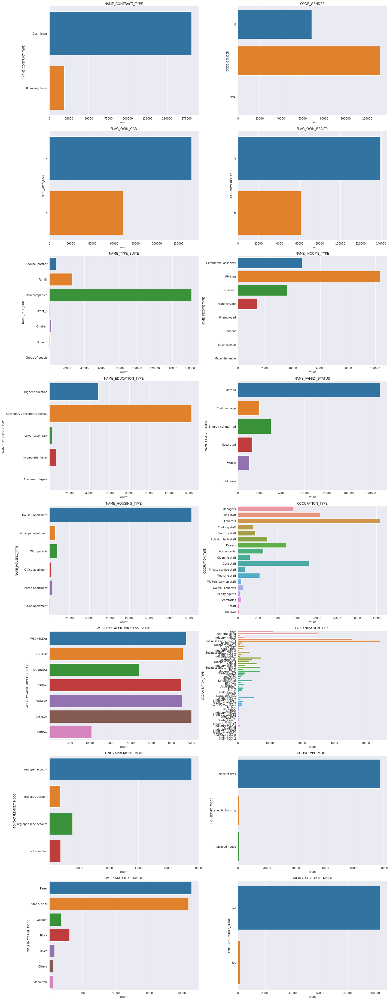

In [ ]:
plotCountPlotForCategoricalFeatures(application_train, atCC)

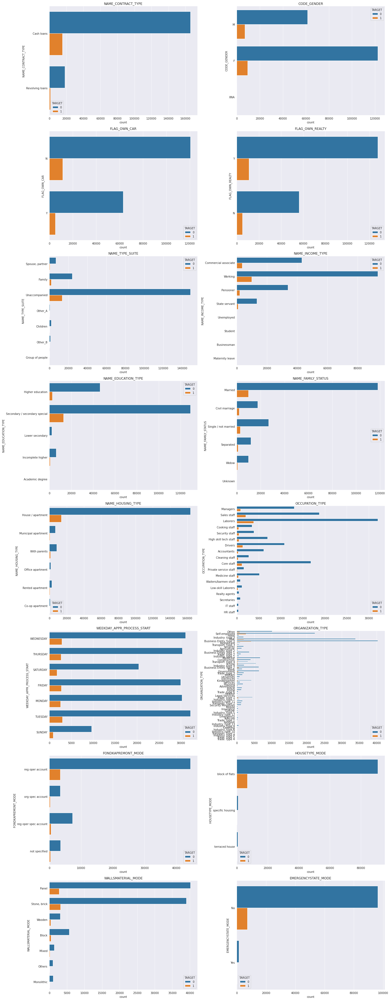

In [ ]:
distributionOfCategoricalFeaturesWRTTarget(application_train, atCC)

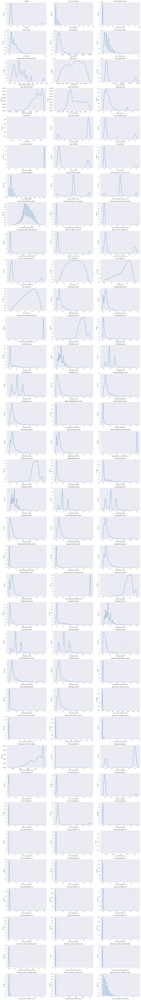

In [ ]:
drawDistributionPlot(application_train, atNC)

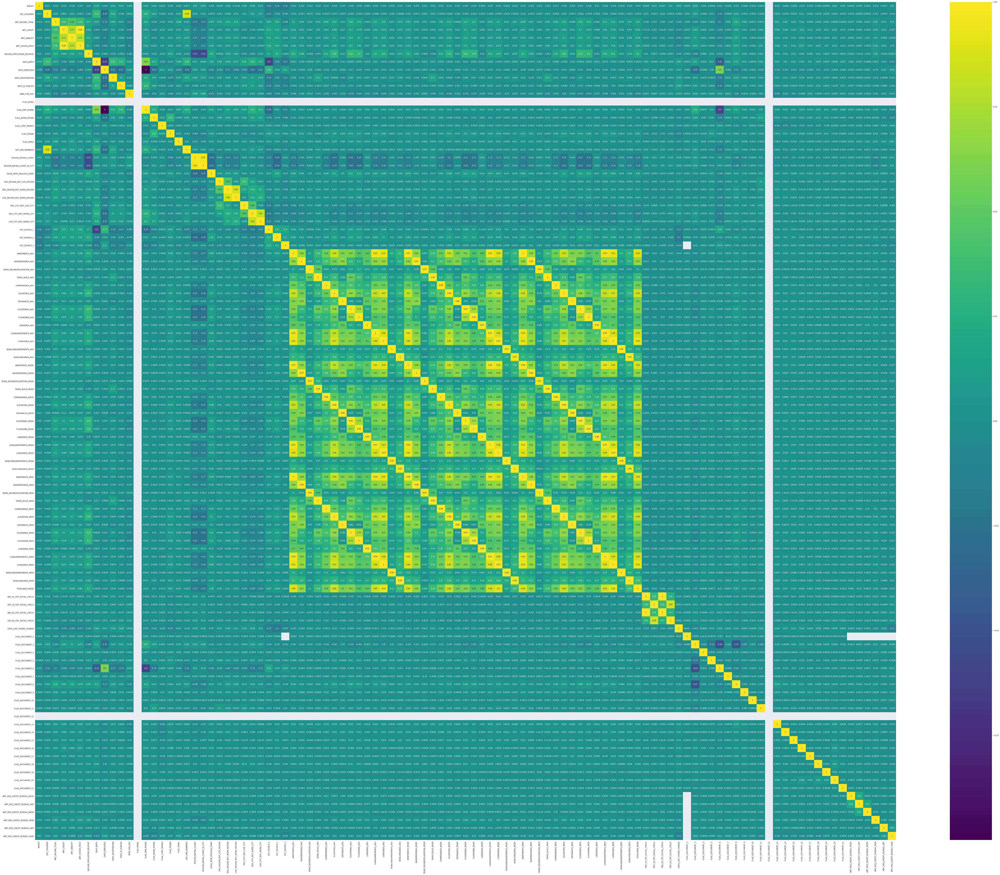

In [ ]:
drawCorrelationMatrix(application_train)

In [ ]:
pd.set_option('max_columns', None)
pd.set_option('max_rows', None)

at_corr=application_train.corr()

In [ ]:
corr_columnwise(application_train.corr())

TARGET +ve
['TARGET']
TARGET -ve
[]
CNT_CHILDREN +ve
['CNT_CHILDREN']
CNT_CHILDREN -ve
[]
AMT_INCOME_TOTAL +ve
['AMT_INCOME_TOTAL']
AMT_INCOME_TOTAL -ve
[]
AMT_CREDIT +ve
['AMT_CREDIT', 'AMT_GOODS_PRICE']
AMT_CREDIT -ve
[]
AMT_ANNUITY +ve
['AMT_ANNUITY']
AMT_ANNUITY -ve
[]
AMT_GOODS_PRICE +ve
['AMT_CREDIT', 'AMT_GOODS_PRICE']
AMT_GOODS_PRICE -ve
[]
REGION_POPULATION_RELATIVE +ve
['REGION_POPULATION_RELATIVE']
REGION_POPULATION_RELATIVE -ve
[]
DAYS_BIRTH +ve
['DAYS_BIRTH']
DAYS_BIRTH -ve
[]
DAYS_EMPLOYED +ve
['DAYS_EMPLOYED']
DAYS_EMPLOYED -ve
['FLAG_EMP_PHONE']
DAYS_REGISTRATION +ve
['DAYS_REGISTRATION']
DAYS_REGISTRATION -ve
[]
DAYS_ID_PUBLISH +ve
['DAYS_ID_PUBLISH']
DAYS_ID_PUBLISH -ve
[]
OWN_CAR_AGE +ve
['OWN_CAR_AGE']
OWN_CAR_AGE -ve
[]
FLAG_MOBIL +ve
[]
FLAG_MOBIL -ve
[]
FLAG_EMP_PHONE +ve
['FLAG_EMP_PHONE']
FLAG_EMP_PHONE -ve
['DAYS_EMPLOYED']
FLAG_WORK_PHONE +ve
['FLAG_WORK_PHONE']
FLAG_WORK_PHONE -ve
[]
FLAG_CONT_MOBILE +ve
['FLAG_CONT_MOBILE']
FLAG_CONT_MOBILE -ve
[]
FLAG_PHON

In [ ]:
pd.reset_option('max_columns')
pd.reset_option('max_rows')

In [ ]:
new_application_train = remove_corr_columns(application_train,atNC,atCC,at_corr)

In [ ]:
labels = new_application_train['TARGET']

new_application_train, new_application_test = new_application_train.align(application_test, join = 'inner', axis = 1)

new_application_train['TARGET'] = labels

print('Training Features shape: ', new_application_train.shape)
print('Testing Features shape: ', new_application_test.shape)

Training Features shape:  (199882, 87)
Testing Features shape:  (107629, 86)


In [ ]:
print(getDetailsAboutOnlyMissingValuesColumns(new_application_train).sort_values(ascending=False))
print(getDetailsAboutOnlyMissingValuesColumns(new_application_test).sort_values(ascending=False))

Shape:  (199882, 87)
COMMONAREA_AVG                 0.699498
NONLIVINGAPARTMENTS_AVG        0.694660
FONDKAPREMONT_MODE             0.684784
FLOORSMIN_AVG                  0.679316
YEARS_BUILD_AVG                0.665723
OWN_CAR_AGE                    0.659459
LANDAREA_AVG                   0.594396
BASEMENTAREA_AVG               0.585901
EXT_SOURCE_1                   0.564348
NONLIVINGAREA_AVG              0.552501
ELEVATORS_AVG                  0.533885
WALLSMATERIAL_MODE             0.509095
APARTMENTS_AVG                 0.508375
ENTRANCES_AVG                  0.504052
HOUSETYPE_MODE                 0.502441
FLOORSMAX_AVG                  0.498424
YEARS_BEGINEXPLUATATION_AVG    0.488523
EMERGENCYSTATE_MODE            0.474500
OCCUPATION_TYPE                0.313870
EXT_SOURCE_3                   0.198397
AMT_REQ_CREDIT_BUREAU_HOUR     0.134995
AMT_REQ_CREDIT_BUREAU_DAY      0.134995
AMT_REQ_CREDIT_BUREAU_WEEK     0.134995
AMT_REQ_CREDIT_BUREAU_MON      0.134995
AMT_REQ_CREDIT_BURE

In [ ]:
imputeCategoricalMissingValuesUsingMode(new_application_train)
imputeNumericMissingValuesUsingMean(new_application_train)

imputeCategoricalMissingValuesUsingMode(new_application_test)
imputeNumericMissingValuesUsingMean(new_application_test)

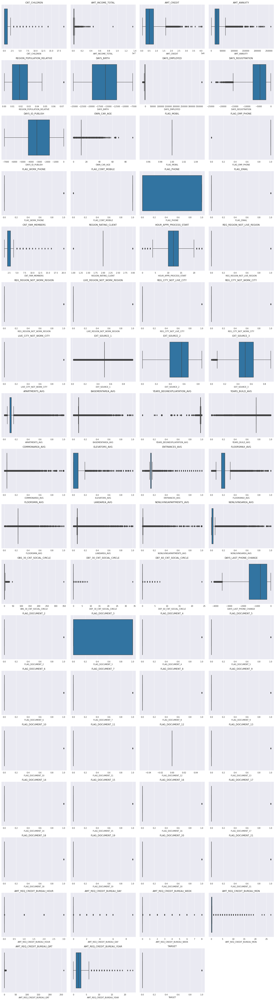

In [ ]:
checkOutlier(new_application_train, getCnamesNumeric(new_application_train))

In [ ]:
#Extract out target variable
dfTarget = new_application_train.TARGET
new_application_train = new_application_train.drop('TARGET', axis = 1)

In [ ]:
atNC = getCnamesNumeric(new_application_train)
atCC = getCnamesObject(new_application_train)

In [ ]:
new_application_train = removeOutlier(new_application_train, atNC)

#######################Exploring Categorical Variable########################

In [ ]:
new_application_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

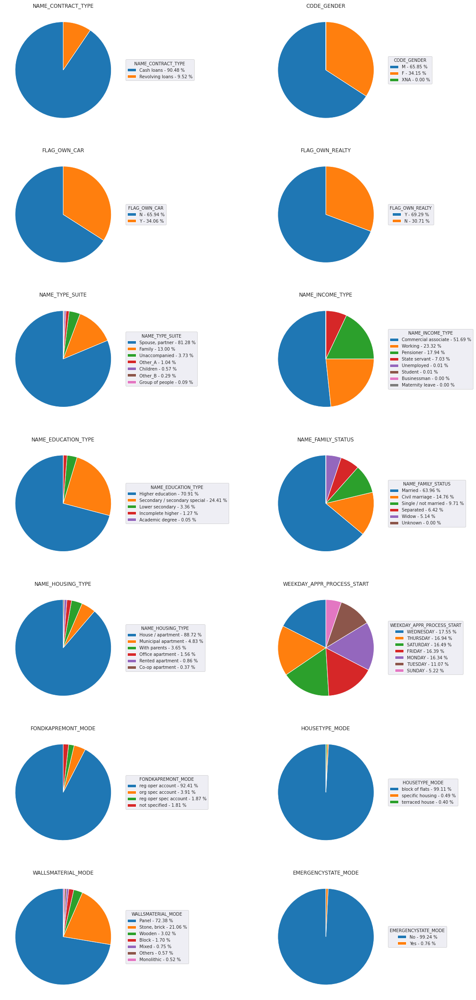

In [ ]:
atCCTemp = atCC
drawPieChartForCategoricalFeatures(new_application_train, atCCTemp)

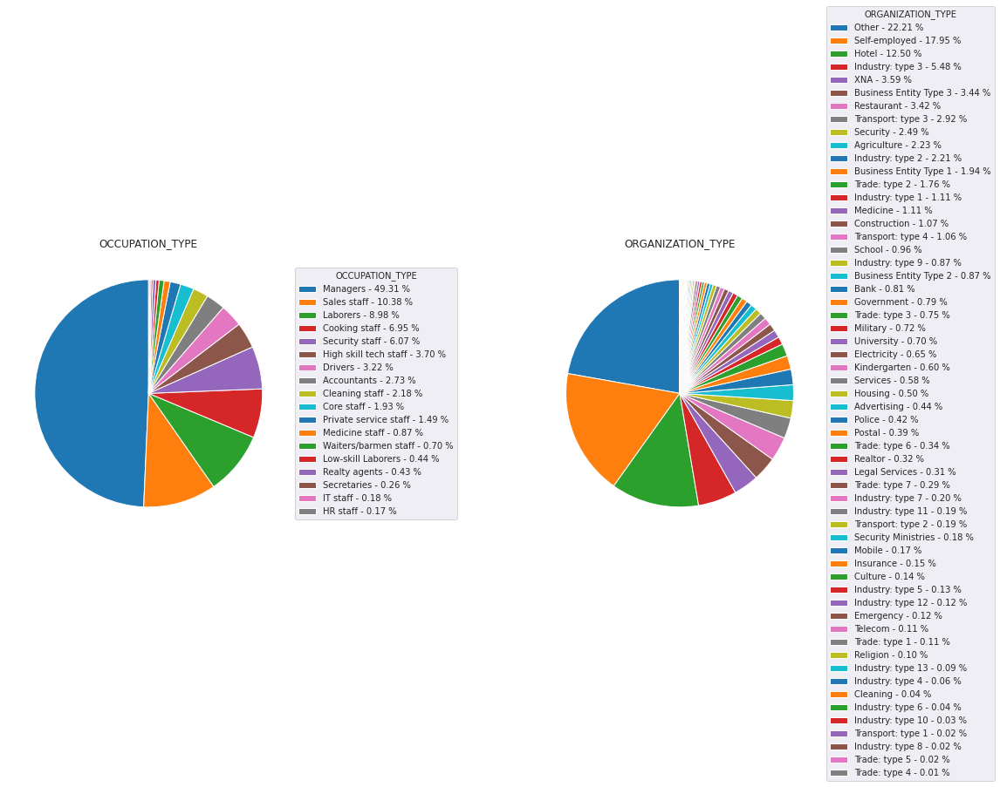

In [ ]:
drawPieChartForCategoricalFeatures(new_application_train, ['OCCUPATION_TYPE','ORGANIZATION_TYPE'])

In [ ]:
dfTarget.value_counts(dropna=True, normalize=True)*100

0    91.879709
1     8.120291
Name: TARGET, dtype: float64

In [ ]:
new_application_train_Temp = applyOneHotEncoding(new_application_train, atCCTemp)
new_application_test_Temp = applyOneHotEncoding(new_application_test, atCCTemp)

In [ ]:
new_application_train_Temp = new_application_train_Temp.drop(['OCCUPATION_TYPE','ORGANIZATION_TYPE'], axis = 1)

In [ ]:
new_application_train_Temp = remove_corr_columns(new_application_train_Temp,
                                                  getCnamesNumeric(new_application_train_Temp),
                                                  getCnamesObject(new_application_train_Temp),
                                                  new_application_train_Temp.corr())

In [ ]:
new_application_train_Temp, new_application_test_Temp = new_application_train_Temp.align(new_application_test_Temp, join = 'inner', axis = 1)

print('Training Features shape: ', new_application_train_Temp.shape)
print('Testing Features shape: ', new_application_test_Temp.shape)

Training Features shape:  (199882, 130)
Testing Features shape:  (107629, 130)


In [ ]:
train = new_application_train_Temp.copy()
test = new_application_test_Temp.copy()
train_labels = labels.copy()
features = list(train.columns)

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit(train)
train = sc.transform(train)
test = sc.transform(test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

random_forest = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)

random_forest.fit(train, train_labels)

feature_importance_values = random_forest.feature_importances_
feature_importances = pd.DataFrame({'feature': features, 'importance': feature_importance_values})

predictions = random_forest.predict_proba(test)[:, 1]

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   53.5s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    1.3s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    2.9s finished


In [ ]:
feature_importances.sort_values('importance', ascending = False)[:10]

,feature,importance
26,EXT_SOURCE_2,0.073251
27,EXT_SOURCE_3,0.062893
5,DAYS_BIRTH,0.053607
8,DAYS_ID_PUBLISH,0.053065
7,DAYS_REGISTRATION,0.052508
6,DAYS_EMPLOYED,0.049013
3,AMT_ANNUITY,0.048539
42,DAYS_LAST_PHONE_CHANGE,0.047084
2,AMT_CREDIT,0.046790
4,REGION_POPULATION_RELATIVE,0.042470


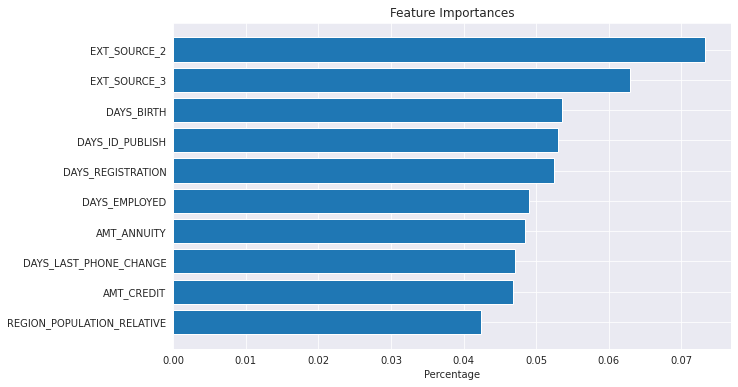

In [ ]:
feature_importances_sorted = plot_feature_importances(feature_importances)

In [ ]:
train = new_application_train_Temp.copy()
test = new_application_test_Temp.copy()

train_ids = application_train['SK_ID_CURR']
test_ids = application_test['SK_ID_CURR']

labels = labels.copy()
feature_names = list(train.columns)

In [ ]:
print('Training Data Shape: ', train.shape)
print('Testing Data Shape: ', test.shape)

AttributeError: ignored

In [ ]:
def model(features, test_features, encoding = 'ohe', n_folds = 5):

    features = np.array(features)
    test_features = np.array(test_features)
    
    # Create the kfold object
    k_fold = StratifiedKFold(n_splits = n_folds, shuffle = True, random_state = 50)
    
    # Feature importances
    feature_importance_values = np.zeros(len(feature_names))
    
    # Test predictions
    test_predictions = np.zeros(test_features.shape[0])
    
    # Empty array for out of fold validation predictions
    out_of_fold = np.zeros(features.shape[0])
    
    # Lists for recording validation and training scores
    valid_scores = []
    train_scores = []
    
    # Iterate through each fold
    for train_indices, valid_indices in k_fold.split(features, labels):
        
        # Training data for the fold
        train_features, train_labels = features[train_indices], labels[train_indices]
        # Validation data for the fold
        valid_features, valid_labels = features[valid_indices], labels[valid_indices]
        
        # Create the model
        model = lgb.LGBMClassifier(n_estimators=10000,
        learning_rate=0.03,
        num_leaves=34,
        colsample_bytree=0.9,
        subsample=0.8,
        max_depth=8,
        reg_alpha=.1,
        reg_lambda=.1,
        min_split_gain=.01,
        min_child_weight=250,
        objective = 'binary')
        
        # Train the model
        model.fit(train_features, train_labels, eval_metric = 'auc',
                  eval_set = [(valid_features, valid_labels), (train_features, train_labels)],
                  eval_names = ['valid', 'train'], early_stopping_rounds = 200, verbose = 200)
        
        # Best iteration
        best_iteration = model.best_iteration_
        
        # Feature importances
        feature_importance_values += model.feature_importances_ / k_fold.n_splits
        
        # Make predictions
        test_predictions += model.predict_proba(test_features, num_iteration = best_iteration)[:, 1] / k_fold.n_splits
        
        # Record the out of fold predictions
        out_of_fold[valid_indices] = model.predict_proba(valid_features, num_iteration = best_iteration)[:, 1]
        
        # Record the best score
        valid_score = model.best_score_['valid']['auc']
        train_score = model.best_score_['train']['auc']
        
        valid_scores.append(valid_score)
        train_scores.append(train_score)
        
        # Clean up memory
        gc.enable()
        del model, train_features, valid_features
        gc.collect()
        
    # Make the submission dataframe
    submission = pd.DataFrame({'SK_ID_CURR': test_ids, 'TARGET': test_predictions})
    
    # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importance_values})
    
    # Overall validation score
    valid_auc = roc_auc_score(labels, out_of_fold)
    
    # Add the overall scores to the metrics
    valid_scores.append(valid_auc)
    train_scores.append(np.mean(train_scores))
    
    # Needed for creating dataframe of validation scores
    fold_names = list(range(n_folds))
    fold_names.append('overall')
    
    # Dataframe of validation scores
    metrics = pd.DataFrame({'fold': fold_names,
                            'train': train_scores,
                            'valid': valid_scores}) 
    
    return submission, feature_importances, metrics

In [ ]:
submission, feature_importance, metrics = model(train, test)

Training until validation scores don't improve for 200 rounds.
[200]	train's binary_logloss: 0.24637	train's auc: 0.762634	valid's binary_logloss: 0.252316	valid's auc: 0.740844
[400]	train's binary_logloss: 0.2419	train's auc: 0.776319	valid's binary_logloss: 0.251508	valid's auc: 0.743139
[600]	train's binary_logloss: 0.238966	train's auc: 0.78562	valid's binary_logloss: 0.2513	valid's auc: 0.743599
[800]	train's binary_logloss: 0.236542	train's auc: 0.793202	valid's binary_logloss: 0.25123	valid's auc: 0.743701
Early stopping, best iteration is:
[731]	train's binary_logloss: 0.23743	train's auc: 0.790402	valid's binary_logloss: 0.251201	valid's auc: 0.743907
Training until validation scores don't improve for 200 rounds.
[200]	train's binary_logloss: 0.246501	train's auc: 0.762275	valid's binary_logloss: 0.252037	valid's auc: 0.740806
[400]	train's binary_logloss: 0.242071	train's auc: 0.776035	valid's binary_logloss: 0.250975	valid's auc: 0.743974
[600]	train's binary_logloss: 0.239

In [ ]:
metrics

,fold,train,valid
0,0,0.795175,0.756184
1,1,0.792203,0.757148
2,2,0.799375,0.760327
3,3,0.790741,0.758094
4,4,0.801509,0.760025
5,overall,0.795800,0.758344


In [ ]:
submission.head()

,SK_ID_CURR,TARGET
0,7auxod,0.071801
1,xur7ur,0.122836
2,eau6rx,0.107083
3,obdr67,0.030179
4,7xbu7d,0.081046


In [ ]:
submission.to_csv('Elite17.csv', index = False)

In [ ]:
gc.collect()